In [33]:
from pathlib import Path
import os, zipfile, io, contextlib
import pandas as pd
import pymol2, chempy
import plotly.express as px
import functools
import numpy as np
import re
from typing import Dict, List
from collections import defaultdict
from plip.structure.preparation import PDBComplex, PLInteraction

# ---- Babel & atom names ------------
## Mod of https://github.com/matteoferla/PLIP-PyRosetta-hotspots-test/blob/main/plipspots_docking/plipspots/serial.py
# https://github.com/pharmai/plip/blob/1fced62c8aeacfaf41008624579bd241e0a3a271/plip/structure/detection.py
from collections import namedtuple
from typing import Union
from openbabel.pybel import Atom, Residue
from openbabel.pybel import ob

hydroph_interaction = namedtuple('hydroph_interaction', 'bsatom bsatom_orig_idx ligatom ligatom_orig_idx '
                                                        'distance restype resnr reschain restype_l, resnr_l, reschain_l')
hbond = namedtuple('hbond', 'a a_orig_idx d d_orig_idx h distance_ah distance_ad angle type protisdon resnr '
                            'restype reschain resnr_l restype_l reschain_l sidechain atype dtype')
pistack = namedtuple(
    'pistack',
    'proteinring ligandring distance angle offset type restype resnr reschain restype_l resnr_l reschain_l')
pication = namedtuple(
    'pication', 'ring charge distance offset type restype resnr reschain restype_l resnr_l reschain_l protcharged')
saltbridge = namedtuple(
    'saltbridge', 'positive negative distance protispos resnr restype reschain resnr_l restype_l reschain_l')
halogenbond = namedtuple('halogenbond', 'acc acc_orig_idx don don_orig_idx distance don_angle acc_angle restype '
                                        'resnr reschain restype_l resnr_l reschain_l donortype acctype sidechain')
waterbridge = namedtuple('waterbridge', 'a a_orig_idx atype d d_orig_idx dtype h water water_orig_idx distance_aw '
                                        'distance_dw d_angle w_angle type resnr restype reschain resnr_l restype_l reschain_l protisdon')
metal_complex = namedtuple('metal_complex', 'metal metal_orig_idx metal_type target target_orig_idx target_type '
                                            'coordination_num distance resnr restype '
                                            'reschain  restype_l reschain_l resnr_l location rms, geometry num_partners complexnum')

itxn_names = (
'hydroph_interaction', 'hbond', 'pistack', 'pication', 'saltbridge', 'halogenbond', 'waterbridge', 'metal_complex')
itxn_names = (hydroph_interaction, hbond, pistack, pication, saltbridge, halogenbond, waterbridge, metal_complex)


def isintxn(instance, cls_or_name: Union[type, str]):
    """
    Is ``interaction`` an instance of a class with the same name as ``cls_or_name``?
    """
    if isinstance(cls_or_name, str):
        name: str = cls_or_name
    else:
        name: str = cls_or_name.__name__
    return instance.__class__.__name__ == name


def get_atomname(atom: Union[Atom, ob.OBAtom]) -> str:
    """
    Given an atom, return its name.
    """
    if isinstance(atom, Atom):
        res: ob.OBResidue = atom.residue.OBResidue
        obatom = atom.OBAtom
    elif isinstance(atom, ob.OBAtom):
        obatom: ob.OBAtom = atom
        res: ob.OBResidue = obatom.GetResidue()
    else:
        return '??'
    return res.GetAtomID(obatom)


def get_itxn_atomnames(itxn) -> List:
    if isintxn(intxn, 'hydroph_interaction'):
        return [get_atomname(intxn.bsatom)]
    elif isintxn(intxn, 'hbond') and itxn.protisdon:
        return [get_atomname(intxn.d)]
    elif isintxn(intxn, 'hbond'):
        return [get_atomname(intxn.a)]
    elif isintxn(intxn, 'pistack'):
        return [get_atomname(a) for a in intxn.proteinring.atoms]
    elif isintxn(intxn, 'pication') and intxn.protcharged:
        return [get_atomname(a) for a in intxn.charge.atoms]
    elif isintxn(intxn, 'pication'):
        return [get_atomname(a) for a in intxn.ring.atoms]
    elif isintxn(intxn, 'saltbridge') and intxn.protispos:
        return [get_atomname(a) for a in intxn.positive.atoms]
    elif isintxn(intxn, 'saltbridge'):
        return [get_atomname(a) for a in intxn.negative.atoms]
    elif isintxn(intxn, 'halogenbond'):
        return [get_atomname(intxn.acc)]
    elif isintxn(intxn, 'waterbridge') and intxn.protisdon:
        return [get_atomname(intxn.d)]
    elif isintxn(intxn, 'waterbridge'):
        return [get_atomname(intxn.a)]
    else:
        raise ValueError('metal_complex')


iter_strip = lambda l: list(map(str.strip, l))


# =================================

def get_lig_info(pdb_block):
    match = re.search(r'HETATM .*LIG (?P<chain>\w)\s*(?P<resi>\d+)', pdb_block)
    return {k: match.group(k) for k in ('chain', 'resi')}


combo = {}
hit_info = {}
apo_info = {}


def get_apoblock(zf: zipfile.ZipFile) -> str:
    if len(zf.namelist()) == 0:
        print(target_name, ' is an empty archive')
        raise ValueError('empty archive')
    # get apo bfactors
    if 'reference.pdb' in zf.namelist():
        return zf.read('reference.pdb').decode('utf-8')
    else:
        choices = [n for n in zf.namelist() if '_bound.pdb' in n]
        if len(choices) == 0:
            choices = [n for n in zf.namelist() if '.pdb' in n]
        return zf.read(choices[0]).decode('utf-8')


def get_itxn(filename, zf) -> List:
    if os.path.splitext(filename)[1] != '.pdb' or '_bound.pdb' not in filename:
        return []
    pdb_block = zf.read(filename).decode('utf-8')
    if 'LIG' not in pdb_block:
        return []
    info: Dict[str, str] = get_lig_info(pdb_block)
    info['xchem_code'] = re.search(r'(\w\d+_\w+)_bound.pdb', finfo.filename).group(1)
    holo = PDBComplex()
    holo.load_pdb(pdb_block, as_string=True)
    holo.analyze()
    return holo.interaction_sets[':'.join(['LIG', info['chain'], info['resi']])].all_itypes


In [40]:
for filepath in Path('fragalysis-downloads').glob('*.zip'):
    target_name = os.path.splitext(os.path.split(filepath)[1])[0]
    try:
        with open(filepath, 'rb') as fh:
            zf = zipfile.ZipFile(fh, "r")
            # -----------------------------------
            # ## Analysis of Apo
            apoblock: str = get_apoblock(zf)
            with pymol2.PyMOL() as pymol:
                pymol.cmd.read_pdbstr(apoblock, 'apo')
                # ligand: no
                a: chempy.Atom
                pymol.cmd.remove('organic')
                bfactors = {(a.chain, a.resi, a.name.strip()): a.b for a in pymol.cmd.get_model('apo').atom if not a.hetatm}
                coords = {(a.chain, a.resi, a.name.strip()): a.coord for a in pymol.cmd.get_model('apo').atom if not a.hetatm}
                cabfactors = {(a.chain, a.resi): a.b for a in pymol.cmd.get_model('apo').atom if a.name == 'CA'}
                pymol.cmd.set('dot_solvent', 1)
                pymol.cmd.set('dot_density', 3)
                get_sele = lambda chain, resi: f'resi {resi} and chain {chain}' if chain else f'resi {resi}'
                sasas = {(chain, resi): pymol.cmd.get_area(get_sele(chain, resi)) for chain, resi in cabfactors}
            # normalise
            # original
            # l = np.array(functools.reduce(lambda x, y: [*x, *y], bfactors.values(), []))
            # med = np.median(l)
            # mad = np.median(np.abs(l - med)) * 1.4826
            # zbfactors = {k: np.median((v - med) / mad) for k, v in bfactors.items()}
            l = np.array(list(bfactors.values()))
            med = np.median(l)
            mad = np.median(np.abs(l - med)) * 1.4826
            zbfactors = {k: (v - med) / mad for k, v in cabfactors.items()}
            # mod use CA only
            l = np.array(list(cabfactors.values()))
            med = np.median(l)
            mad = np.median(np.abs(l - med)) * 1.4826
            zcabfactors = {k: (v - med) / mad for k, v in cabfactors.items()}
            apo_info[target_name] = {'target_name': target_name,
                                     'bfactors': bfactors, 
                                     'coords': coords, 
                                     'sasas': sasas, 
                                     'cabfactors': cabfactors,
                                    }
            # -----------------------------------
            # ## Count
            counts = {k: defaultdict(int) for k in (
                'hydroph_interaction', 'hbond', 'pistack', 'waterbridge', 'saltbridge', 'pication', 'halogenbond')}
            n_hits = 0
            for finfo in zf.infolist():
                intxns: List = get_itxn(finfo.filename, zf)
                if not intxns:
                    continue
                n_hits += 1
                for intxn in intxns:
                    for atomname in get_itxn_atomnames(intxn):
                        counts[intxn.__class__.__name__][(intxn.reschain, str(intxn.resnr))] += 1
                        # Add only the first actually.
                        break
                hit_info[finfo.filename] = dict(target_name=target_name,
                                                intxns=[dict(category=intxn.__class__.__name__, 
                                                         chain=intxn.reschain, 
                                                         resi=str(intxn.resnr), 
                                                         atomnames=get_itxn_atomnames(intxn)) for intxn in intxns])
            # ratio
            hit_rates = defaultdict(int)
            split_hit_rates = {intxn_type: defaultdict(int) for intxn_type in counts}
            for intxn_type in counts:
                for k in counts[intxn_type]:
                    split_hit_rates[intxn_type][k] = counts[intxn_type][k] / n_hits
                    hit_rates[k] += counts[intxn_type][k] / n_hits
        # << zip closed.
        # -----------------------------------
        # ## Save
        data = pd.DataFrame({#'bfactor_median': zbfactors,
                             'bfactor_CA': zcabfactors,
                             'sasa': sasas,
                             # 'bfactor': bfactors, # this is a per-atom list
                             #'ca_bfactor': cabfactors,
                             'hit_rate': hit_rates,
                             **split_hit_rates})
        combo[target_name] = data
        print(f'{target_name} done')
    except Exception as error:
        print(f'{target_name} error: {error.__class__.__name__}={error}')

print('DONE', len(combo))

ALAS2A  is an empty archive
ALAS2A error: ValueError=empty archive
NSP16 error: ValueError=not enough values to unpack (expected 3, got 2)
NUDT7A error: ValueError=not enough values to unpack (expected 3, got 2)
Nprot error: ValueError=not enough values to unpack (expected 3, got 2)
NSP15_B error: ValueError=not enough values to unpack (expected 3, got 2)
CAMK1DA error: ValueError=not enough values to unpack (expected 3, got 2)
INPP5DA error: ValueError=not enough values to unpack (expected 3, got 2)
NSP14 error: ValueError=not enough values to unpack (expected 3, got 2)
SOS3ATA error: ValueError=not enough values to unpack (expected 3, got 2)
EPB41L3A error: ValueError=not enough values to unpack (expected 3, got 2)
PHIPA error: ValueError=not enough values to unpack (expected 3, got 2)
ATAD2A error: ValueError=not enough values to unpack (expected 3, got 2)
MID2A error: ValueError=not enough values to unpack (expected 3, got 2)
mArh error: ValueError=not enough values to unpack (expe

In [2]:
combo['BRD1A']

bfactor_CA        sasa  hit_rate  hydroph_interaction  hbond  pistack  \
A 22     1.547715  107.107300       NaN                  NaN    NaN      NaN   
  23     0.369364  185.852432       NaN                  NaN    NaN      NaN   
  24     1.084003   67.141853       NaN                  NaN    NaN      NaN   
  25     1.746449   97.011116       NaN                  NaN    NaN      NaN   
  26     0.967573   73.202507       NaN                  NaN    NaN      NaN   
...           ...         ...       ...                  ...    ...      ...   
B 140   -0.140519   92.537231       NaN                  NaN    NaN      NaN   
  141   -0.204756   67.098282       NaN                  NaN    NaN      NaN   
  142    0.620291   37.173962       NaN                  NaN    NaN      NaN   
  143    1.409204   26.964695       NaN                  NaN    NaN      NaN   
  144    4.586938  145.719360       NaN                  NaN    NaN      NaN   

       waterbridge  saltbridge  pication  halogenbond  
A 22           NaN         NaN       NaN          NaN  
  23           NaN         NaN       NaN          NaN  
  24           NaN         NaN       NaN          NaN  
  25           NaN         NaN       NaN          NaN  
  26           NaN         NaN       NaN          NaN  
...            ...         ...       ...          ...  
B 140          NaN         NaN       NaN          NaN  
  141          NaN         NaN       NaN          NaN  
  142          NaN         NaN       NaN          NaN  
  143          NaN         NaN       NaN          NaN  
  144          NaN         NaN       NaN          NaN  

[244 rows x 10 columns]

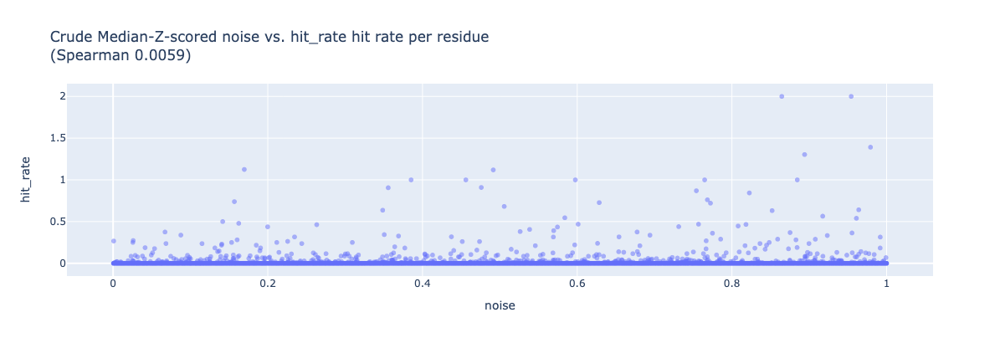

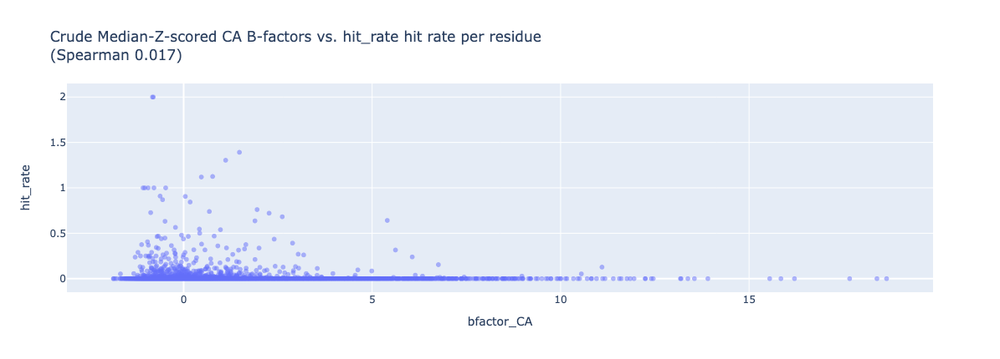

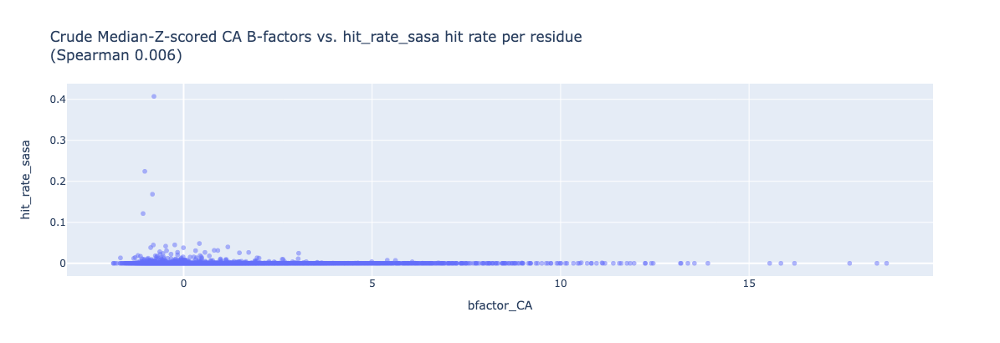

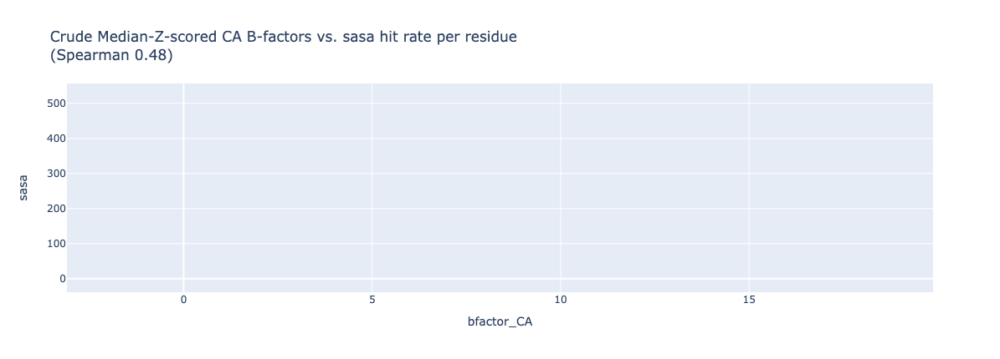

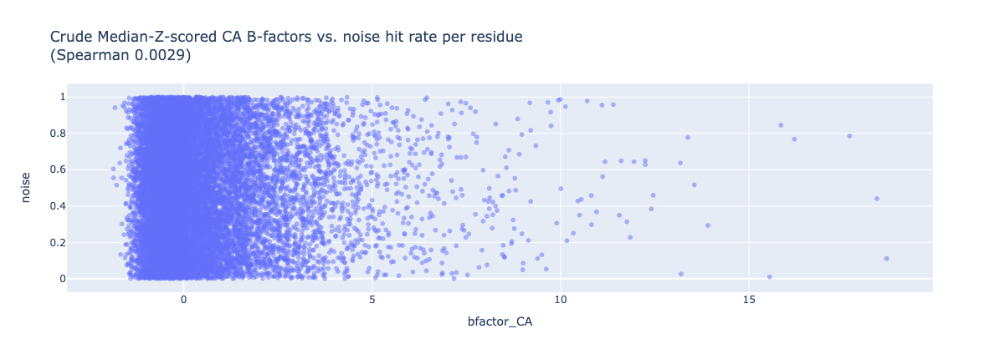

...

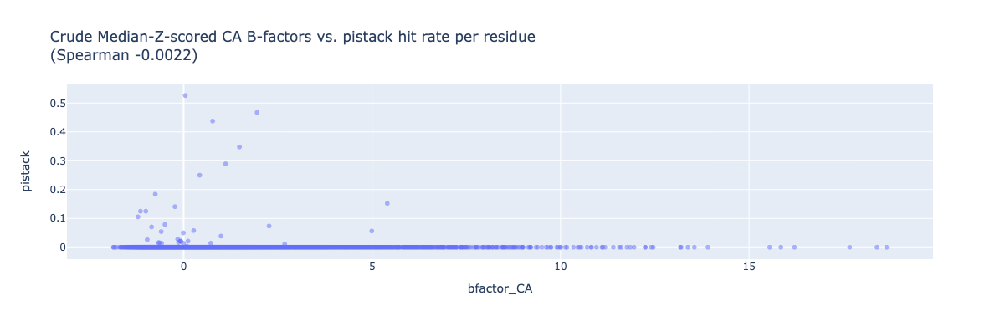

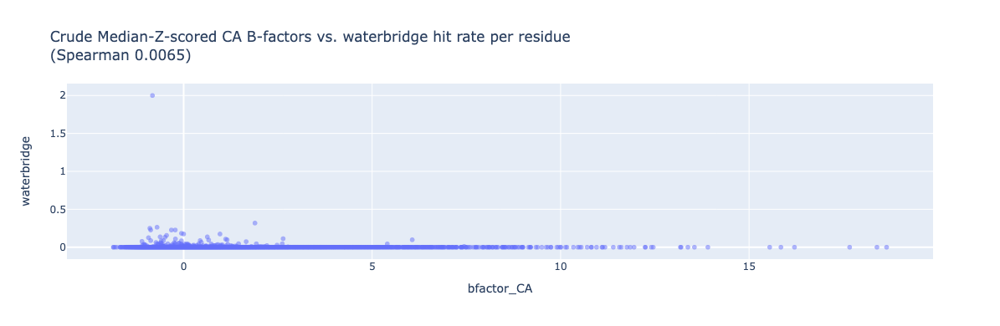

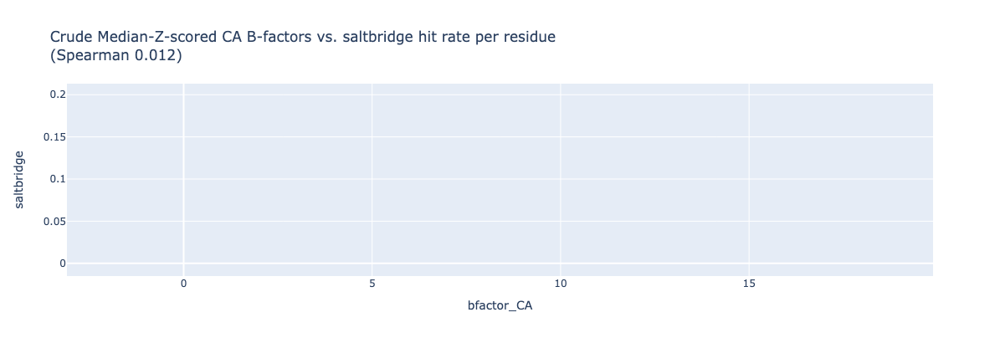

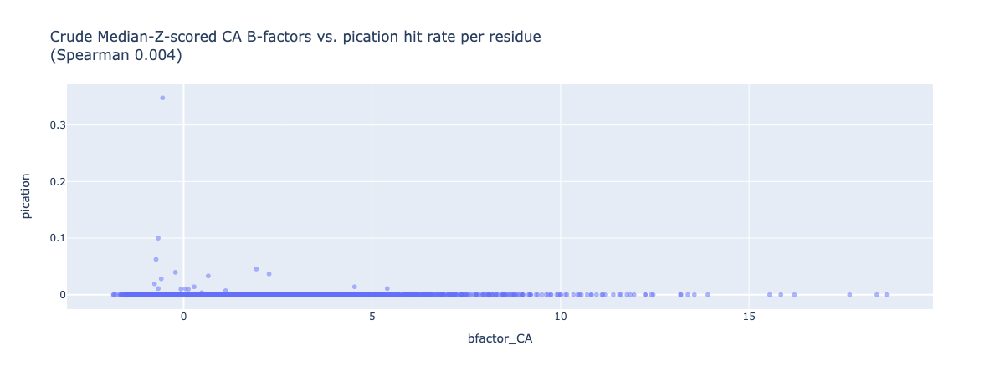

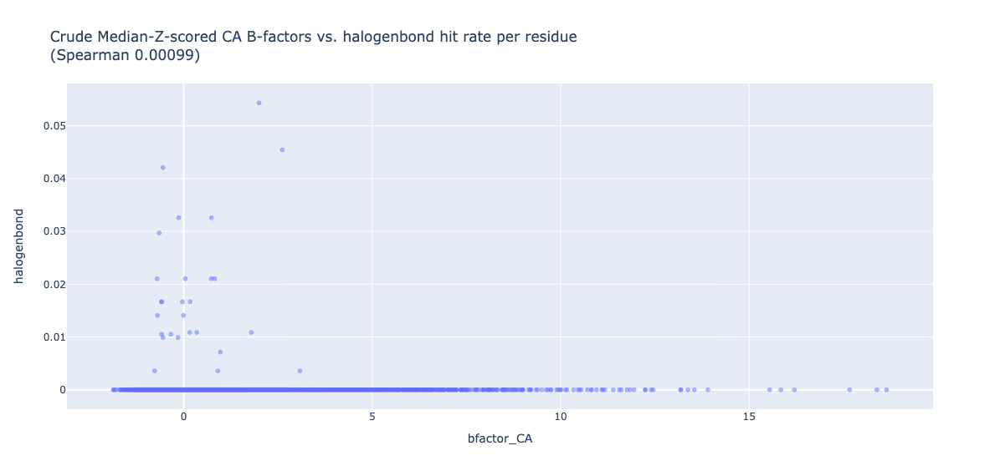

In [3]:
import plotly.express as px
import operator, random

data = pd.concat(list(combo.values()))
data = data.loc[~data.bfactor_CA.isna()].copy().fillna(0)
data['hit_rate_sasa'] = data.hit_rate / data.sasa
data['noise'] = data.hit_rate_sasa.apply(lambda row: random.random() )

j = 'noise'
k = 'hit_rate'
spear = data[j].corr(data[k], method='spearman')
px.scatter(data, j, k,
               opacity=0.5,
               title=f'Crude Median-Z-scored {j} vs. {k} hit rate per residue<br>(Spearman {spear:.2})').show()

for k in ('hit_rate', 'hit_rate_sasa', 'sasa', 'noise', 'hydroph_interaction', 'hbond', 'pistack', 'waterbridge', 'saltbridge', 'pication', 'halogenbond'):
    spear = data.bfactor_CA.corr(data[k], method='spearman')
    px.scatter(data, 'bfactor_CA', k,
               opacity=0.5,
               title=f'Crude Median-Z-scored CA B-factors vs. {k} hit rate per residue<br>(Spearman {spear:.2})').show()

In [4]:
combo

dict_keys(['NUDT7A', 'Nprot', 'NSP15_B', 'CAMK1DA', 'INPP5DA', 'NSP14', 'SOS3ATA', 'EPB41L3A', 'PHIPA', 'ATAD2A', 'MID2A', 'mArh', 'FAM83BA', 'nsp13', 'TNCA', 'Mac1', 'NUDT7A_CRUDE', 'SMTGR', 'NUDT21A', 'MUREECA', 'MURD', 'ATAD', 'NUDT4', 'PTP1B', 'CD44MMA', 'OXA10OTA', 'PARP14A', 'FALZA', 'ACVR1A', 'DCP2B', 'HAO1A', 'NUDT5A', 'BRD1A', 'STAG1A', 'smTGRNEW', 'macro-combi', 'DCLRE1AA', 'VIM2', 'TBXTA', 'XX02KALRNA', 'NUDT4A'])

In [8]:

for filepath in Path('fragalysis-downloads').glob('*.zip'):
    target_name = os.path.splitext(os.path.split(filepath)[1])[0]
    if 'XX01ZVNS2B' == target_name:
        print(target_name)

XX01ZVNS2B


In [ ]:
for filepath in Path('fragalysis-downloads').glob('*.zip'):
    target_name = os.path.splitext(os.path.split(filepath)[1])[0]
    if 'XX01ZVNS2B' != target_name:
        continue
    try:
        with open(filepath, 'rb') as fh:
            zf = zipfile.ZipFile(fh, "r")
            # -----------------------------------
            # ## Analysis of Apo
            apoblock: str = get_apoblock(zf)
            with pymol2.PyMOL() as pymol:
                pymol.cmd.read_pdbstr(apoblock, 'apo')
                # ligand: no
                a: chempy.Atom
                pymol.cmd.remove('organic')
                bfactors = {(a.chain, a.resi, a.name.strip()): a.b for a in pymol.cmd.get_model('apo').atom if not a.hetatm}
                coords = {(a.chain, a.resi, a.name.strip()): a.coord for a in pymol.cmd.get_model('apo').atom if not a.hetatm}
                cabfactors = {(a.chain, a.resi, 'CA'): a.b for a in pymol.cmd.get_model('apo').atom if a.name == 'CA'}
                resn = {(a.chain, a.resi, a.name.strip()): a.resn for a in pymol.cmd.get_model('apo').atom}
                pymol.cmd.set('dot_solvent', 1)
                pymol.cmd.set('dot_density', 3)
                get_sele = lambda chain, resi: f'resi {resi} and chain {chain}' if chain else f'resi {resi}'
                sasas = {(chain, resi): pymol.cmd.get_area(get_sele(chain, resi)) for chain, resi, name in cabfactors}
            # normalise
            # original
            # l = np.array(functools.reduce(lambda x, y: [*x, *y], bfactors.values(), []))
            # med = np.median(l)
            # mad = np.median(np.abs(l - med)) * 1.4826
            # zbfactors = {k: np.median((v - med) / mad) for k, v in bfactors.items()}
            l = np.array(list(bfactors.values()))
            med = np.median(l)
            mad = np.median(np.abs(l - med)) * 1.4826
            zbfactors = {k: (v - med) / mad for k, v in cabfactors.items()}
            # mod use CA only
            l = np.array(list(cabfactors.values()))
            med = np.median(l)
            mad = np.median(np.abs(l - med)) * 1.4826
            zcabfactors = {k: (v - med) / mad for k, v in cabfactors.items()}
            apo_info[target_name] = {'target_name': target_name,
                                     'bfactors': bfactors, 
                                     'coords': coords, 
                                     'sasas': sasas,
                                     'resn': resn,
                                     'cabfactors': cabfactors,
                                    }
            # -----------------------------------
            # ## Count
            counts = {k: defaultdict(int) for k in (
                'hydroph_interaction', 'hbond', 'pistack', 'waterbridge', 'saltbridge', 'pication', 'halogenbond')}
            n_hits = 0
            for finfo in zf.infolist():
                try:
                    intxns: List = get_itxn(finfo.filename, zf)
                except Exception as error:
                    continue
                if not intxns:
                    continue
                n_hits += 1
                for intxn in intxns:
                    for atomname in get_itxn_atomnames(intxn):
                        counts[intxn.__class__.__name__][(intxn.reschain, str(intxn.resnr))] += 1
                        # Add only the first actually.
                        break
                hit_info[finfo.filename] = dict(target_name=target_name,
                                                intxns=[dict(category=intxn.__class__.__name__, 
                                                         chain=intxn.reschain, 
                                                         resi=str(intxn.resnr),
                                                         atomnames=get_itxn_atomnames(intxn)) for intxn in intxns])
            # ratio
            hit_rates = defaultdict(int)
            split_hit_rates = {intxn_type: defaultdict(int) for intxn_type in counts}
            for intxn_type in counts:
                for k in counts[intxn_type]:
                    split_hit_rates[intxn_type][k] = counts[intxn_type][k] / n_hits
                    hit_rates[k] += counts[intxn_type][k] / n_hits
        # << zip closed.
        # -----------------------------------
        # ## Save
        data = pd.DataFrame({#'bfactor_median': zbfactors,
                             'bfactor_CA': {k[:2]: v for k, v in zcabfactors.items()},
                             'sasa': sasas,
                             # 'bfactor': bfactors, # this is a per-atom list
                             #'ca_bfactor': cabfactors,
                             'resn': resn,
                             'hit_rate': hit_rates,
                             **split_hit_rates})
        combo[target_name] = data
        print(f'{target_name} done')
    except () as error:
        print(f'{target_name} error: {error.__class__.__name__}={error}')

print('DONE', len(combo))

XX01ZVNS2B done
DONE 42


In [57]:
hit_rates

defaultdict(int,
            {('B', '150'): 0.41304347826086957,
             ('B', '161'): 1.5217391304347825,
             ('B', '155'): 0.10869565217391304,
             ('B', '51'): 0.19565217391304346,
             ('B', '118'): 0.043478260869565216,
             ('B', '123'): 0.08695652173913043,
             ('B', '129'): 0.2826086956521739,
             ('B', '27'): 0.043478260869565216,
             ('B', '36'): 0.08695652173913043,
             ('B', '132'): 0.13043478260869565,
             ('B', '69'): 0.043478260869565216,
             ('B', '83'): 0.043478260869565216,
             ('A', '83'): 0.06521739130434782,
             ('B', '135'): 0.13043478260869565,
             ('B', '151'): 0.043478260869565216,
             ('B', '130'): 0.2826086956521739,
             ('B', '120'): 0.043478260869565216,
             ('B', '171'): 0.043478260869565216,
             ('B', '153'): 0.043478260869565216,
             ('B', '122'): 0.08695652173913043})

In [61]:
data = pd.DataFrame({#'bfactor_median': zbfactors,
                             'bfactor_CA': {k[:2]: v for k, v in zcabfactors.items()},
                             'sasa': sasas,
                             # 'bfactor': bfactors, # this is a per-atom list
                             #'ca_bfactor': cabfactors,
                             'resn': {k[:2]: v for k, v in resn.items()},
                             'hit_rate': hit_rates,
                             **split_hit_rates}).fillna(0)

In [72]:
data.loc[data.hit_rate.astype(bool)].sort_values('hbond', ascending=False).round(2)

bfactor_CA    sasa resn  hit_rate  hydroph_interaction  hbond  pistack  \
B 130        0.01   50.40  TYR      0.28                 0.00   0.26     0.00   
  129        0.70   96.67  ASP      0.28                 0.02   0.15     0.00   
  135       -0.52    6.44  SER      0.13                 0.00   0.13     0.00   
A 83         0.39   81.63  ASP      0.07                 0.00   0.07     0.00   
B 120        1.37  128.42  ASP      0.04                 0.00   0.04     0.00   
  36         0.00   39.42  VAL      0.09                 0.04   0.04     0.00   
  151       -0.66   13.67  GLY      0.04                 0.00   0.04     0.00   
  171        4.14  173.99  GLU      0.04                 0.00   0.04     0.00   
  83        -0.81    6.88  TRP      0.04                 0.02   0.02     0.00   
  161        0.69   43.67  TYR      1.52                 0.52   0.02     0.93   
  69        -1.15   78.56  TRP      0.04                 0.02   0.00     0.02   
  118        0.43   37.40  THR      0.04                 0.04   0.00     0.00   
  122        0.82  104.36  ASP      0.09                 0.00   0.00     0.00   
  123        0.77   52.53  ILE      0.09                 0.09   0.00     0.00   
  27         0.55    9.58  THR      0.04                 0.04   0.00     0.00   
  51        -0.35   65.91  HIS      0.20                 0.07   0.00     0.13   
  132       -0.08   82.21  ALA      0.13                 0.09   0.00     0.00   
  150       -0.95    4.57  TYR      0.41                 0.41   0.00     0.00   
  153       -0.14   18.04  GLY      0.04                 0.00   0.00     0.00   
  155        1.14   86.99  VAL      0.11                 0.11   0.00     0.00   

       waterbridge  saltbridge  pication  halogenbond  
B 130         0.02        0.00      0.00          0.0  
  129         0.04        0.07      0.00          0.0  
  135         0.00        0.00      0.00          0.0  
A 83          0.00        0.00      0.00          0.0  
B 120         0.00        0.00      0.00          0.0  
  36          0.00        0.00      0.00          0.0  
  151         0.00        0.00      0.00          0.0  
  171         0.00        0.00      0.00          0.0  
  83          0.00        0.00      0.00          0.0  
  161         0.00        0.00      0.04          0.0  
  69          0.00        0.00      0.00          0.0  
  118         0.00        0.00      0.00          0.0  
  122         0.09        0.00      0.00          0.0  
  123         0.00        0.00      0.00          0.0  
  27          0.00        0.00      0.00          0.0  
  51          0.00        0.00      0.00          0.0  
  132         0.04        0.00      0.00          0.0  
  150         0.00        0.00      0.00          0.0  
  153         0.04        0.00      0.00          0.0  
  155         0.00        0.00      0.00          0.0

In [32]:
import json

with open('XX01ZVNS2B.json', 'w') as fh:
    json.dump(hit_info, fh)